# CNN Food Classifier - Food101 Classification

This notebook implements a CNN-based food classifier using transfer learning with EfficientNet.

## Model Architecture
**Input**: Dual-input (RGB image + optional mask) - so this can be trained before receiving the mask

**Base Model**: EfficientNetB0 (pre-trained on ImageNet)

**Dataset**: Food101 (101 food classes) from Keras

**Output**: Class name + confidence score


#### Architecture and hyper parameter choices and reasonings

**Mask Branch Architecture:**
```
Conv2D(32, kernel=3) → MaxPooling2D(2) →
Conv2D(64, kernel=3) → MaxPooling2D(2) →
Conv2D(128, kernel=3) → GlobalAveragePooling2D →
Dense(128)
```

I chose the 3x3 kernel since for being computationally efficient for quick training along with progressing filters for matching complexity. Pooling helped reduce spatial demensions while keeping features that are important. This was mainly to keep a lightweight design. 

Image size was also kept to 224x224 since this is native to EfficientNetB0 training but also because it keeps enough detail while staying lightweight, large images would take much longer in training times. It's also more memory efficent which makes training easier. Batch size I changed from 32 to 64 to better use the GPU memory, going any larger (to 128) caused a crash due to memory allocation hitting max. 

#### Training hyperparameters 

Initial learning rate was 2e-4 (0.0002) to stay conservative and prevent unlearning of initial features. 

Data was augmented to assist in traiing with conservative transformations to keep pictures within expectations of actual photos. Dropout was implemented due to past experience with it helping model be less reliant of certain nuerons, it would have been good to explore this further. 

45 Epochs for initial training with early dropping typically resulted in close to 40 or so epochs until it stopped and 25 for fine tuning was very similar as well, stopping around 10-15. These seemed good numbers to aim for as learning was just starting to stall. Early stopping prevents training that did not produce any additional accuracy. Freezing initial layers and fine tuning the final layers prevented overfitting of the training dataset and promoted generalization of the model. 

#### Quick Table of decisions

| Hyperparameter | Value | Primary Justification |
|----------------|-------|----------------------|
| **Image Size** | 224x224 | EfficientNet standard, memory efficiency |
| **Batch Size** | 64 | GPU memory optimization, stable gradients |
| **Initial LR** | 2e-4 | Transfer learning best practice |
| **Fine-tune LR** | 3e-4 | More parameters, but still conservative |
| **Dropout (head)** | 0.5, 0.3 | Strong regularization where most parameters exist |
| **Dropout (branch)** | 0.3 | Moderate regularization for feature branches |
| **Kernel Size** | 3x3 | Standard choice for CNNs, efficient receptive field building |
| **Pooling** | GlobalAveragePooling2D |  anti-overfitting |
| **Optimizer** | Adam | Adaptive learning, robust for transfer learning |
| **Phase 1 Epochs** | 45 | Sufficient for initial convergence |
| **Phase 2 Epochs** | 25 (stopped at 6) | Fine-tuning needs less time for less layers |
| **Early Stopping Patience** | 5 | Allows recovery from temporary plateaus |
| **LR Reduction Patience** | 3 | Responsive but not too aggressive |

## Training Strategy
1. **Phase 1**: Train top layers with frozen EfficientNet base
2. **Phase 2**: Fine-tune last layers of EfficientNet

## 1. Connect to Google drive and setup paths for saving

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
from pathlib import Path

# Set base paths for Colab
BASE_PATH = '/content/drive/MyDrive/CSB410_Final'
MODELS_PATH  = os.path.join(BASE_PATH, "models")
DATA_CACHE_PATH = os.path.join(BASE_PATH, "data_cache")
PROCESSED_DATA_PATH = os.path.join(BASE_PATH, "datasets", "food101_processed")


print("MODELS_PATH :", MODELS_PATH)
print("DATA_CACHE_PATH :", DATA_CACHE_PATH)
print("PROCESSED_DATA_PATH :", PROCESSED_DATA_PATH)


MODELS_PATH : /content/drive/MyDrive/CSB410_Final/models
DATA_CACHE_PATH : /content/drive/MyDrive/CSB410_Final/data_cache
PROCESSED_DATA_PATH : /content/drive/MyDrive/CSB410_Final/datasets/food101_processed


## 2. Import Dependencies

In [3]:
# Core libraries
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Check GPU availability
print("\n" + "="*60)
print("SYSTEM CONFIGURATION")
print("="*60)
print(f"TensorFlow version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")
# Ensure mixed_precision is imported before trying to access its global_policy


SYSTEM CONFIGURATION
TensorFlow version: 2.19.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## 3. Load Food101 Dataset

In [4]:
# ============================================================
# PATH CONFIGURATION
# ============================================================
# Strategy: Use local VM for fast I/O during training,
# checkpoint to Google Drive for persistence

# Google Drive paths (for persistence/checkpoints)
DRIVE_BASE_PATH = '/content/drive/MyDrive/CSB410_Final'
DRIVE_MODELS_PATH = os.path.join(DRIVE_BASE_PATH, "models")
DRIVE_DATA_CACHE_PATH = os.path.join(DRIVE_BASE_PATH, "data_cache")
DRIVE_PROCESSED_DATA_PATH = os.path.join(DRIVE_BASE_PATH, "datasets", "food101_processed")

# Local VM paths (for fast training)
LOCAL_BASE_PATH = '/content/local_training'
LOCAL_MODELS_PATH = os.path.join(LOCAL_BASE_PATH, "models")
LOCAL_DATA_CACHE_PATH = os.path.join(LOCAL_BASE_PATH, "data_cache")
LOCAL_PROCESSED_DATA_PATH = os.path.join(LOCAL_BASE_PATH, "datasets", "food101_processed")

# Create local directories
os.makedirs(LOCAL_MODELS_PATH, exist_ok=True)
os.makedirs(LOCAL_DATA_CACHE_PATH, exist_ok=True)
os.makedirs(LOCAL_PROCESSED_DATA_PATH, exist_ok=True)

# Create Drive directories
os.makedirs(DRIVE_MODELS_PATH, exist_ok=True)
os.makedirs(DRIVE_DATA_CACHE_PATH, exist_ok=True)
os.makedirs(DRIVE_PROCESSED_DATA_PATH, exist_ok=True)

#### Load files from google drive to prevent reextract of dataset

And save after loading

In [5]:
import shutil
def load_checkpoint_from_drive(drive_path, local_path, description="checkpoint"):
    """
    Load checkpoint from Google Drive to local VM.

    Args:
        drive_path: Path to file/folder on Google Drive
        local_path: Destination path on local VM
        description: Description of what's being loaded

    Returns:
        bool: True if successful, False otherwise
    """
    try:
        if not os.path.exists(drive_path):
            print(f" No {description} found on Drive at {drive_path}")
            return False

        if os.path.isfile(drive_path):
            os.makedirs(os.path.dirname(local_path), exist_ok=True)
            shutil.copy2(drive_path, local_path)
            size_mb = os.path.getsize(local_path) / (1024 * 1024)
            print(f" Loaded {description} from Drive ({size_mb:.2f} MB)")
        elif os.path.isdir(drive_path):
            if os.path.exists(local_path):
                shutil.rmtree(local_path)
            shutil.copytree(drive_path, local_path)
            print(f" Loaded {description} directory from Drive")
        return True
    except Exception as e:
        print(f" Failed to load {description} from Drive: {e}")
        return False


def save_checkpoint_to_drive(local_path, drive_path, description="checkpoint"):
    """Copy data from local VM to Google Drive for persistence"""
    import shutil

    if not os.path.exists(local_path):
        print(f"Warning: Local path {local_path} does not exist, skipping backup")
        return

    # Create parent directory on Drive if needed
    os.makedirs(os.path.dirname(drive_path), exist_ok=True)

    # Remove existing Drive copy if present
    if os.path.exists(drive_path):
        print(f"Removing old {description} from Drive...")
        shutil.rmtree(drive_path)

    print(f"Copying {description} to Drive...")
    print(f"  From: {local_path}")
    print(f"  To: {drive_path}")

    shutil.copytree(local_path, drive_path)
    print(f" Saved {description} to Drive")

In [6]:
# ============================================================
# CHECK FOR PREPROCESSED DATA (Drive or Local)
# ============================================================

# Check Drive first for preprocessed data
drive_train_path = os.path.join(DRIVE_PROCESSED_DATA_PATH, "train")
drive_val_path = os.path.join(DRIVE_PROCESSED_DATA_PATH, "val")
drive_test_path = os.path.join(DRIVE_PROCESSED_DATA_PATH, "test")
drive_metadata_path = os.path.join(DRIVE_PROCESSED_DATA_PATH, "metadata.json")

# Check local for preprocessed data
local_train_path = os.path.join(LOCAL_PROCESSED_DATA_PATH, "train")
local_val_path = os.path.join(LOCAL_PROCESSED_DATA_PATH, "val")
local_test_path = os.path.join(LOCAL_PROCESSED_DATA_PATH, "test")
local_metadata_path = os.path.join(LOCAL_PROCESSED_DATA_PATH, "metadata.json")

print("=" * 60)
print("CHECKING FOR EXISTING PREPROCESSED DATA")
print("=" * 60)

# Check if data exists on Drive
drive_datasets_exist = (
    os.path.exists(drive_train_path) and
    os.path.exists(drive_val_path) and
    os.path.exists(drive_test_path) and
    os.path.exists(drive_metadata_path)
)

# Check if data exists locally
local_datasets_exist = (
    os.path.exists(local_train_path) and
    os.path.exists(local_val_path) and
    os.path.exists(local_test_path) and
    os.path.exists(local_metadata_path)
)

print(f"\nDrive preprocessed data: {' Found' if drive_datasets_exist else ' Not found'}")
print(f"Local preprocessed data: {' Found' if local_datasets_exist else ' Not found'}")

# Decision logic
if local_datasets_exist:
    print("\n Using existing local preprocessed data (fastest)")
    use_local = True
    datasets_exist = True
elif drive_datasets_exist:
    print("\n Found preprocessed data on Drive, copying to local VM...")
    # Copy from Drive to local
    load_checkpoint_from_drive(drive_train_path, local_train_path, "train dataset")
    load_checkpoint_from_drive(drive_val_path, local_val_path, "val dataset")
    load_checkpoint_from_drive(drive_test_path, local_test_path, "test dataset")
    load_checkpoint_from_drive(drive_metadata_path, local_metadata_path, "metadata")
    use_local = True
    datasets_exist = True
else:
    print("\n No preprocessed data found, will load and process from scratch")
    datasets_exist = False
    use_local = False

print("=" * 60)

CHECKING FOR EXISTING PREPROCESSED DATA

Drive preprocessed data:  Not found
Local preprocessed data:  Not found

 No preprocessed data found, will load and process from scratch


#### Loading dataset with 10% to reduce experimentation load and training

In [9]:
import shutil
# LOAD OR PROCESS DATASET
# ============================================================

if datasets_exist:
    print("=" * 60)
    print("LOADING PREPROCESSED DATASETS")
    print("=" * 60)
    print(f"Loading from: {local_metadata_path}\n")

    # Load metadata
    import json
    with open(local_metadata_path, 'r') as f:
        metadata = json.load(f)

    NUM_CLASSES = metadata['num_classes']
    CLASS_NAMES = metadata['class_names']

    print(f"Dataset Info (from cache):")
    print(f"  Number of classes: {NUM_CLASSES}")
    print(f"  Training samples: {metadata['train_samples']}")
    print(f"  Validation samples: {metadata['val_samples']}")
    print(f"  Test samples: {metadata['test_samples']}")
    print(f"\nFirst 10 classes: {CLASS_NAMES[:10]}")

    # Load the saved TensorFlow datasets
    print(f"\nLoading saved datasets from disk...")
    train_ds = tf.data.experimental.load(local_train_path)
    val_ds = tf.data.experimental.load(local_val_path)
    test_ds = tf.data.experimental.load(local_test_path)

    print("Datasets loaded successfully from cache")

else:
    print("=" * 60)
    print("FIRST-TIME SETUP: LOADING & PROCESSING DATASET")
    print("=" * 60)
    print(f"Will cache to local: {LOCAL_DATA_CACHE_PATH}")
    print(f"Will backup to Drive: {DRIVE_DATA_CACHE_PATH}\n")

    # Load Food101 dataset from TensorFlow Datasets
    print("Loading Food101 dataset...")

    # Check if VALID cached data exists on Drive
    drive_dataset_info = os.path.join(DRIVE_DATA_CACHE_PATH, 'food101/2.0.0/dataset_info.json')

    if os.path.exists(drive_dataset_info):
        print(f"Found valid cached raw data on Drive, copying to local VM...")
        load_checkpoint_from_drive(DRIVE_DATA_CACHE_PATH, LOCAL_DATA_CACHE_PATH, "raw dataset cache")
        load_kwargs = {
            'as_supervised': True,
            'download': False,  # Don't download, use cached
            'data_dir': LOCAL_DATA_CACHE_PATH
        }
    else:
        # Download fresh to local, then backup to Drive
        if os.path.exists(DRIVE_DATA_CACHE_PATH):
            print(f"Removing corrupted cache from Drive...")

            shutil.rmtree(DRIVE_DATA_CACHE_PATH)

        load_kwargs = {
            'as_supervised': True,
            'download': True,
            'try_gcs': True,
            'data_dir': LOCAL_DATA_CACHE_PATH
        }
        print(f"Downloading fresh data to local VM: {LOCAL_DATA_CACHE_PATH}")

    # Load dataset (using subset for testing)
    # For full dataset, use: split=['train[:90%]', 'train[90%:]', 'validation']
    (train_ds, val_ds, test_ds), dataset_info = tfds.load(
        'food101',
        split=['train[:9%]', 'train[9%:10%]', 'validation[:10%]'],
        with_info=True,
        **load_kwargs
    )

    # Get dataset information
    NUM_CLASSES = dataset_info.features['label'].num_classes
    CLASS_NAMES = dataset_info.features['label'].names

    print(f"\nDataset Info:")
    print(f"  Number of classes: {NUM_CLASSES}")
    print(f"  Training samples: {tf.data.experimental.cardinality(train_ds).numpy()}")
    print(f"  Validation samples: {tf.data.experimental.cardinality(val_ds).numpy()}")
    print(f"  Test samples: {tf.data.experimental.cardinality(test_ds).numpy()}")
    print(f"\nFirst 10 classes: {CLASS_NAMES[:10]}")

    # Save metadata locally
    print(f"\nSaving metadata locally: {local_metadata_path}")
    metadata = {
        'num_classes': NUM_CLASSES,
        'class_names': CLASS_NAMES,
        'train_samples': int(tf.data.experimental.cardinality(train_ds).numpy()),
        'val_samples': int(tf.data.experimental.cardinality(val_ds).numpy()),
        'test_samples': int(tf.data.experimental.cardinality(test_ds).numpy())
    }

    import json
    with open(local_metadata_path, 'w') as f:
        json.dump(metadata, f, indent=2)

    # Save the TensorFlow datasets to disk
    print(f"\nSaving preprocessed datasets to: {LOCAL_PROCESSED_DATA_PATH}")
    print("  Saving train dataset...")
    tf.data.experimental.save(train_ds, local_train_path)
    print("  Saving validation dataset...")
    tf.data.experimental.save(val_ds, local_val_path)
    print("  Saving test dataset...")
    tf.data.experimental.save(test_ds, local_test_path)
    print("Datasets saved locally")

    # Backup datasets to Drive
    print("\nBacking up preprocessed datasets to Drive...")
    save_checkpoint_to_drive(local_train_path, drive_train_path, "train dataset")
    save_checkpoint_to_drive(local_val_path, drive_val_path, "val dataset")
    save_checkpoint_to_drive(local_test_path, drive_test_path, "test dataset")

    # handle metadata.json as a file
    print(f"Copying metadata to Drive...")
    print(f"  From: {local_metadata_path}")
    print(f"  To: {drive_metadata_path}")
    os.makedirs(os.path.dirname(drive_metadata_path), exist_ok=True)
    if os.path.exists(drive_metadata_path):
        os.remove(drive_metadata_path)
    shutil.copy2(local_metadata_path, drive_metadata_path)
    print(f" Saved metadata to Drive")

    # Backup raw cache to Drive if it was freshly downloaded
    if not os.path.exists(drive_dataset_info):
        print("\nBacking up raw data cache to Drive...")
        save_checkpoint_to_drive(LOCAL_DATA_CACHE_PATH, DRIVE_DATA_CACHE_PATH, "raw dataset cache")

print("\n Dataset loaded successfully")

FIRST-TIME SETUP: LOADING & PROCESSING DATASET
Will cache to local: /content/local_training/data_cache
Will backup to Drive: /content/drive/MyDrive/CSB410_Final/data_cache

Loading Food101 dataset...

Dataset Info:
  Number of classes: 101
  Training samples: 6818
  Validation samples: 757
  Test samples: 2525

First 10 classes: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito']

Saving metadata locally: /content/local_training/datasets/food101_processed/metadata.json

Saving preprocessed datasets to: /content/local_training/datasets/food101_processed
  Saving train dataset...
  Saving validation dataset...
  Saving test dataset...
Datasets saved locally

Backing up preprocessed datasets to Drive...
Removing old train dataset from Drive...
Copying train dataset to Drive...
  From: /content/local_training/datasets/food101_processed/train
  To: /content/drive/MyDrive/CSB410_Final/dataset

#### Save the data to google drive

In [11]:
metadata_path = os.path.join(PROCESSED_DATA_PATH, "metadata.json")

# Save metadata for future runs
print(f"\n Saving metadata to: {metadata_path}")
metadata = {
    'num_classes': NUM_CLASSES,
    'class_names': CLASS_NAMES,
    'train_samples': int(tf.data.experimental.cardinality(train_ds).numpy()),
    'val_samples': int(tf.data.experimental.cardinality(val_ds).numpy()),
    'test_samples': int(tf.data.experimental.cardinality(test_ds).numpy())
}


 Saving metadata to: /content/drive/MyDrive/CSB410_Final/datasets/food101_processed/metadata.json


## 4. Data Preprocessing Pipeline

In [12]:
from tensorflow.keras.applications.efficientnet import preprocess_input

# Hyperparameters
IMG_SIZE = 224
BATCH_SIZE = 64
SHUFFLE_BUFFER = 1000
AUTOTUNE = tf.data.AUTOTUNE

def resize_image(image, label):
    """Just resize, keep uint8 for augmentation"""
    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
    return image, label

def augment_image(image, label):
    """Apply augmentation BEFORE normalization (on [0, 255] range)"""
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_brightness(image, max_delta=25.0)  # [0-255] scale
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    image = tf.clip_by_value(image, 0.0, 255.0)
    return image, label

def apply_efficientnet_preprocessing(image, label):
    """Apply EfficientNet preprocessing LAST"""
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)
    return image, label

def add_dummy_mask(image, label):
    """Add dummy mask for dual-input model"""
    mask = tf.ones((IMG_SIZE, IMG_SIZE, 1), dtype=tf.float32)
    return (image, mask), label

# Prepare training dataset with caching
print("Preparing training dataset...")
train_dataset = (
    train_ds
    .map(resize_image, num_parallel_calls=AUTOTUNE)
    .cache()  # Cache resized images
    .map(augment_image, num_parallel_calls=AUTOTUNE)           # Augment on [0,255]
    .map(apply_efficientnet_preprocessing, num_parallel_calls=AUTOTUNE)  # THEN normalize
    .map(add_dummy_mask, num_parallel_calls=AUTOTUNE)
    .shuffle(SHUFFLE_BUFFER)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

# Prepare validation dataset (no augmentation) with caching
print("Preparing validation dataset...")
val_dataset = (
    val_ds
    .map(resize_image, num_parallel_calls=AUTOTUNE)
    .cache()  # Cache resized images
    .map(apply_efficientnet_preprocessing, num_parallel_calls=AUTOTUNE)
    .map(add_dummy_mask, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

# Prepare test dataset with caching
print("Preparing test dataset...")
test_dataset = (
    test_ds
    .map(resize_image, num_parallel_calls=AUTOTUNE)
    .cache()  # Cache resized images
    .map(apply_efficientnet_preprocessing, num_parallel_calls=AUTOTUNE)
    .map(add_dummy_mask, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

print(f"Data preprocessing complete")
print(f"Image size: {IMG_SIZE}x{IMG_SIZE}")
print(f"Batch size: {BATCH_SIZE}")

Preparing training dataset...
Preparing validation dataset...
Preparing test dataset...
Data preprocessing complete
Image size: 224x224
Batch size: 64


## 5. Visualize Sample Data

Sample training images:


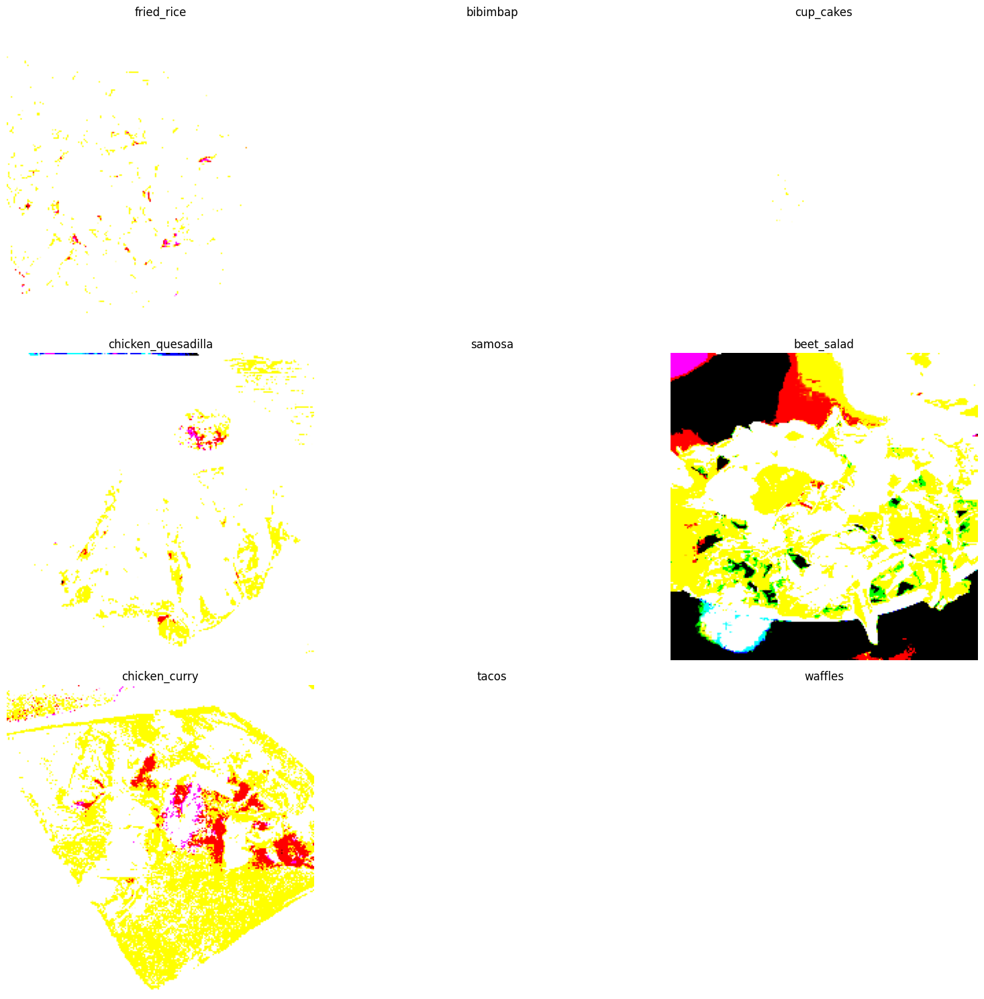

In [13]:
# Visualize a batch of training images
def plot_sample_images(dataset, class_names, num_images=9):
    """Plot a grid of sample images with labels"""
    plt.figure(figsize=(15, 15))

    # Get one batch
    for (images, masks), labels in dataset.take(1):
        for i in range(min(num_images, len(images))):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy())
            plt.title(f"{class_names[labels[i]]}")
            plt.axis('off')

    plt.tight_layout()
    plt.show()

print("Sample training images:")
plot_sample_images(train_dataset, CLASS_NAMES)

## 6. Build Dual-Input CNN Model

In [14]:
def build_dual_input_cnn(num_classes, img_size=224):
    """
    Build a dual-input CNN model for food classification.

    Architecture:
    - Input 1: RGB image (256, 256, 3) -> EfficientNetB0 -> features
    - Input 2: Mask (256, 256, 1) -> Lightweight CNN -> features
    - Concatenate features -> Dense layers -> Output (101 classes)

    Args:
        num_classes: Number of output classes
        img_size: Input image size

    Returns:
        Keras Model with dual inputs
    """

    # Input 1: RGB Image
    image_input = layers.Input(shape=(img_size, img_size, 3), name='image_input')

    # EfficientNetB0 as base model (pre-trained on ImageNet)
    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_shape=(img_size, img_size, 3),
        pooling=None
    )

    # Initially freeze the base model for transfer learning
    base_model.trainable = False

    # Image branch
    x1 = base_model(image_input, training=False)
    x1 = layers.GlobalAveragePooling2D(name='image_gap')(x1)
    x1 = layers.BatchNormalization(name='image_bn')(x1)
    x1 = layers.Dense(512, activation='relu', name='image_dense')(x1)
    x1 = layers.Dropout(0.3, name='image_dropout')(x1)

    # Input 2: Mask (for future integration with autoencoder)
    mask_input = layers.Input(shape=(img_size, img_size, 1), name='mask_input')

    # Mask branch (lightweight CNN)
    x2 = layers.Conv2D(32, 3, activation='relu', padding='same', name='mask_conv1')(mask_input)
    x2 = layers.MaxPooling2D(2)(x2)
    x2 = layers.Conv2D(64, 3, activation='relu', padding='same', name='mask_conv2')(x2)
    x2 = layers.MaxPooling2D(2)(x2)
    x2 = layers.Conv2D(128, 3, activation='relu', padding='same', name='mask_conv3')(x2)
    x2 = layers.GlobalAveragePooling2D(name='mask_gap')(x2)
    x2 = layers.Dense(128, activation='relu', name='mask_dense')(x2)

    # Concatenate features from both branches
    combined = layers.Concatenate(name='concatenate')([x1, x2])

    # Classification head
    x = layers.Dropout(0.5, name='dropout1')(combined)
    x = layers.Dense(256, activation='relu', name='fc1')(x)
    x = layers.Dropout(0.3, name='dropout2')(x)
    output = layers.Dense(num_classes, activation='softmax', name='output')(x)

    # Create model
    model = models.Model(
        inputs=[image_input, mask_input],
        outputs=output,
        name='dual_input_food_classifier'
    )

    return model, base_model

# Build the model
print("Building dual-input CNN model...")
model, base_model = build_dual_input_cnn(NUM_CLASSES, IMG_SIZE)

# Display model summary
model.summary()

print(f"\nTotal parameters: {model.count_params():,}")
print(f"Trainable parameters: {sum([tf.size(w).numpy() for w in model.trainable_weights]):,}")
print(f"Non-trainable parameters: {sum([tf.size(w).numpy() for w in model.non_trainable_weights]):,}")

Building dual-input CNN model...
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "dual_input_food_classifier"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ mask_input          │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mask_conv1 (Conv2D) │ (None, 224, 224,  │        320 │ mask_input[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ image_input         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 112, 112,  │          0 │ mask_conv1[0][0]  │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ efficientnetb0      │ (None, 7, 7,      │  4,049,571 │ image_input[0][0] │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mask_conv2 (Conv2D) │ (None, 112, 112,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ image_gap           │ (None, 1280)      │          0 │ efficientnetb0[0… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 56, 56,    │          0 │ mask_conv2[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ image_bn            │ (None, 1280)      │      5,120 │ image_gap[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mask_conv3 (Conv2D) │ (None, 56, 56,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ image_dense (Dense) │ (None, 512)       │    655,872 │ image_bn[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mask_gap            │ (None, 128)       │          0 │ mask_conv3[0][0]  │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ image_dropout       │ (None, 512)       │          0 │ image_dense[0][0] │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mask_dense (Dense)  │ (None, 128)       │     16,512 │ mask_gap[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 640)       │          0 │ image_dropout[0]… │
│ (Concatenate)       │                   │            │ mask_dense[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout1 (Dropout)  │ (None, 640)       │          0 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ fc1 (Dense)         │ (None, 256)       │    164,096 │ dropout1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout2 (Dropout)  │ (None, 256)       │          0 │ fc1[0][0]         │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 5,009,800 (19.11 MB)

 Trainable params: 957,669 (3.65 MB)

 Non-trainable params: 4,052,131 (15.46 MB)


Total parameters: 5,009,800
Trainable parameters: 957,669
Non-trainable parameters: 4,052,131


## 7. Model Compilation

In [15]:
# Compile the model
INITIAL_LEARNING_RATE = 2e-4

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=INITIAL_LEARNING_RATE),
    loss='sparse_categorical_crossentropy',
    metrics=[
        'accuracy',
        keras.metrics.SparseTopKCategoricalAccuracy(k=5, name='top_5_accuracy')
    ]
)

print("Model compiled")
print(f"Optimizer: Adam (lr={INITIAL_LEARNING_RATE})")
print(f"Loss: Sparse Categorical Crossentropy")
print(f"Metrics: Accuracy, Top-5 Accuracy")

Model compiled
Optimizer: Adam (lr=0.0002)
Loss: Sparse Categorical Crossentropy
Metrics: Accuracy, Top-5 Accuracy


## 8. Setup Training Callbacks

In [16]:
# Define checkpoint path
checkpoint_path = os.path.join(MODELS_PATH, 'cnn_food_classifier_best.keras')

# Create TensorBoard log directory with timestamp
from datetime import datetime
log_dir = os.path.join(MODELS_PATH, 'logs', 'fit', datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,  # Log weight histograms every epoch
    write_graph=True,
    write_images=False,
    update_freq='epoch',
    profile_batch='10,20',  # Profile batches 10-20 for performance analysis
    embeddings_freq=0
)

# Setup callbacks
callbacks = [
    # TensorBoard for real-time visualization
    tensorboard_callback,

    # Save best model based on validation loss
    keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_path,
        monitor='val_loss',
        save_best_only=True,
        verbose=1,
        mode='min'
    ),

    # Early stopping to prevent overfitting
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),

    # Reduce learning rate on plateau
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-8,
        verbose=1
    ),

    # CSV logger for training history
    keras.callbacks.CSVLogger(
        os.path.join(MODELS_PATH, 'training_history.csv'),
        append=True
    )
]

print("Training callbacks configured:")
print("- TensorBoard: Real-time training visualization")
print("- ModelCheckpoint: Save best model")
print("- EarlyStopping: Patience = 5")
print("- ReduceLROnPlateau: Factor = 0.5, Patience = 3")
print("- CSVLogger: Save training history")
print(f"\nCheckpoint path: {checkpoint_path}")
print(f"TensorBoard logs: {log_dir}")


Training callbacks configured:
- TensorBoard: Real-time training visualization
- ModelCheckpoint: Save best model
- EarlyStopping: Patience = 5
- ReduceLROnPlateau: Factor = 0.5, Patience = 3
- CSVLogger: Save training history

Checkpoint path: /content/drive/MyDrive/CSB410_Final/models/cnn_food_classifier_best.keras
TensorBoard logs: /content/drive/MyDrive/CSB410_Final/models/logs/fit/20251216-084023


In [17]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/CSB410_Final/models/logs/fit

<IPython.core.display.Javascript object>

## 9. Training Phase 1 - Transfer Learning (Frozen Base)

In [18]:
# Phase 1: Train with frozen EfficientNet base
print("=" * 60)
print("PHASE 1: Transfer Learning (Frozen EfficientNet Base)")
print("=" * 60)

PHASE1_EPOCHS = 45

print(f"\nTraining for {PHASE1_EPOCHS} epochs with frozen base model")
print(f"Trainable parameters: {sum([tf.size(w).numpy() for w in model.trainable_weights]):,}\n")

history_phase1 = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=PHASE1_EPOCHS,
    callbacks=callbacks,
    verbose=1
)

print("\nPhase 1 training complete")

PHASE 1: Transfer Learning (Frozen EfficientNet Base)

Training for 45 epochs with frozen base model
Trainable parameters: 957,669

Epoch 1/45
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.0144 - loss: 5.2533 - top_5_accuracy: 0.0652
Epoch 1: val_loss improved from inf to 4.50276, saving model to /content/drive/MyDrive/CSB410_Final/models/cnn_food_classifier_best.keras
107/107 ━━━━━━━━━━━━━━━━━━━━ 134s 748ms/step - accuracy: 0.0144 - loss: 5.2508 - top_5_accuracy: 0.0654 - val_accuracy: 0.0832 - val_loss: 4.5028 - val_top_5_accuracy: 0.2312 - learning_rate: 2.0000e-04
Epoch 2/45
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.0594 - loss: 4.4270 - top_5_accuracy: 0.1758
Epoch 2: val_loss improved from 4.50276 to 4.17601, saving model to /content/drive/MyDrive/CSB410_Final/models/cnn_food_classifier_best.keras
107/107 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.0595 - loss: 4.4264 - top_5_accuracy: 0.1760 - val_accuracy: 0.2048 - val_loss: 4.1760 - val_top_5_accur

## 10. Training Phase 2 - Fine-Tuning

In [19]:
# Phase 2: Fine-tune the last layers of EfficientNet
print("=" * 60)
print("PHASE 2: Fine-Tuning EfficientNet Layers")
print("=" * 60)

# Unfreeze the base model
base_model.trainable = True

# Freeze all layers except the last 20
print(f"\nTotal layers in EfficientNetB0: {len(base_model.layers)}")

# Freeze early layers, train only last layers
LAYERS_TO_FREEZE = len(base_model.layers) - 40

for layer in base_model.layers[:LAYERS_TO_FREEZE]:
    layer.trainable = False

for layer in base_model.layers[LAYERS_TO_FREEZE:]:
    layer.trainable = True

print(f"Frozen layers: {LAYERS_TO_FREEZE}")
print(f"Trainable layers: {len(base_model.layers) - LAYERS_TO_FREEZE}")

# lower learning rate for fine-tuning
FINE_TUNE_LEARNING_RATE = 0.0003

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=FINE_TUNE_LEARNING_RATE),
    loss='sparse_categorical_crossentropy',
    metrics=[
        'accuracy',
        keras.metrics.SparseTopKCategoricalAccuracy(k=5, name='top_5_accuracy')
    ]
)

print(f"\nModel recompiled with learning rate: {FINE_TUNE_LEARNING_RATE}")
print(f"Trainable parameters: {sum([tf.size(w).numpy() for w in model.trainable_weights]):,}\n")

# Continue training
PHASE2_EPOCHS = 25
TOTAL_EPOCHS = PHASE1_EPOCHS + PHASE2_EPOCHS

print(f"Fine-tuning for {PHASE2_EPOCHS} more epochs\n")

history_phase2 = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=TOTAL_EPOCHS,
    initial_epoch=history_phase1.epoch[-1] + 1,
    callbacks=callbacks,
    verbose=1
)

print("\nPhase 2 fine-tuning complete")

PHASE 2: Fine-Tuning EfficientNet Layers

Total layers in EfficientNetB0: 238
Frozen layers: 198
Trainable layers: 40

Model recompiled with learning rate: 0.0003
Trainable parameters: 3,008,373

Fine-tuning for 25 more epochs

Epoch 41/70
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.4210 - loss: 2.2458 - top_5_accuracy: 0.7239
Epoch 41: val_loss did not improve from 1.79551
107/107 ━━━━━━━━━━━━━━━━━━━━ 81s 404ms/step - accuracy: 0.4215 - loss: 2.2435 - top_5_accuracy: 0.7244 - val_accuracy: 0.5363 - val_loss: 1.8899 - val_top_5_accuracy: 0.7966 - learning_rate: 3.0000e-04
Epoch 42/70
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6054 - loss: 1.4367 - top_5_accuracy: 0.8698
Epoch 42: val_loss improved from 1.79551 to 1.78704, saving model to /content/drive/MyDrive/CSB410_Final/models/cnn_food_classifier_best.keras
107/107 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - accuracy: 0.6054 - loss: 1.4368 - top_5_accuracy: 0.8697 - val_accuracy: 0.5641 - val_loss: 1.7870 - val_top

## 11. Training Visualization

Training History Visualization:


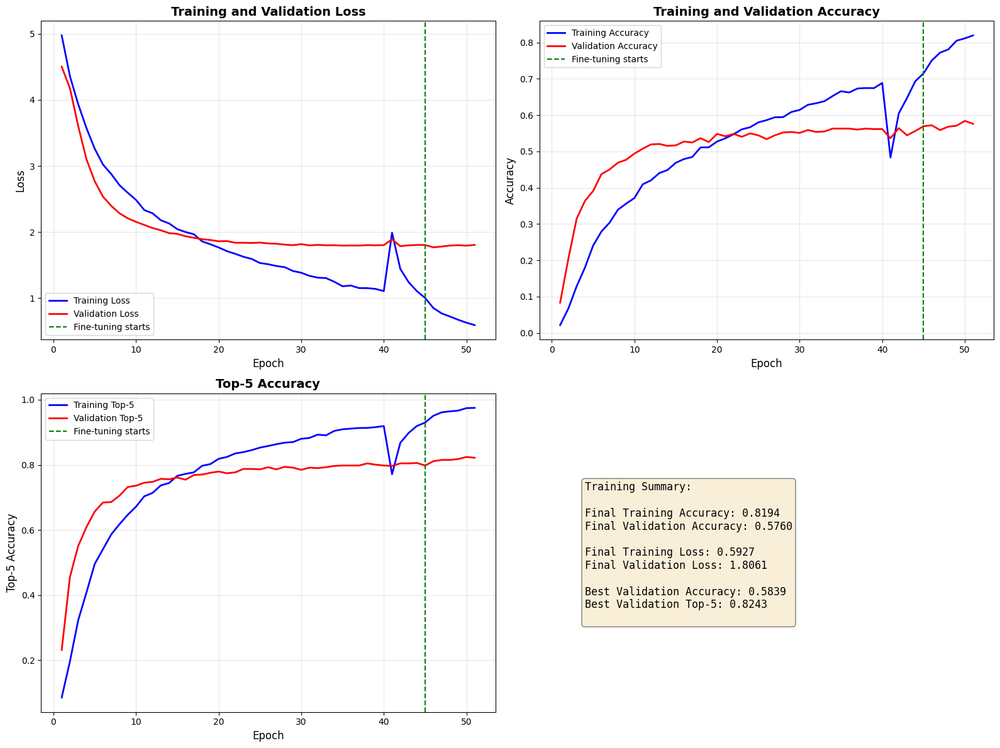

In [20]:
# Combine training histories
def combine_histories(hist1, hist2):
    """Combine two training histories"""
    combined = {}
    for key in hist1.history.keys():
        combined[key] = hist1.history[key] + hist2.history[key]
    return combined

full_history = combine_histories(history_phase1, history_phase2)

# Plot training history
def plot_training_history(history, phase1_epochs):
    """Plot training and validation metrics"""
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    epochs = range(1, len(history['loss']) + 1)

    # Plot 1: Loss
    axes[0, 0].plot(epochs, history['loss'], 'b-', label='Training Loss', linewidth=2)
    axes[0, 0].plot(epochs, history['val_loss'], 'r-', label='Validation Loss', linewidth=2)
    axes[0, 0].axvline(x=phase1_epochs, color='green', linestyle='--', label='Fine-tuning starts')
    axes[0, 0].set_xlabel('Epoch', fontsize=12)
    axes[0, 0].set_ylabel('Loss', fontsize=12)
    axes[0, 0].set_title('Training and Validation Loss', fontsize=14, fontweight='bold')
    axes[0, 0].legend(fontsize=10)
    axes[0, 0].grid(True, alpha=0.3)

    # Plot 2: Accuracy
    axes[0, 1].plot(epochs, history['accuracy'], 'b-', label='Training Accuracy', linewidth=2)
    axes[0, 1].plot(epochs, history['val_accuracy'], 'r-', label='Validation Accuracy', linewidth=2)
    axes[0, 1].axvline(x=phase1_epochs, color='green', linestyle='--', label='Fine-tuning starts')
    axes[0, 1].set_xlabel('Epoch', fontsize=12)
    axes[0, 1].set_ylabel('Accuracy', fontsize=12)
    axes[0, 1].set_title('Training and Validation Accuracy', fontsize=14, fontweight='bold')
    axes[0, 1].legend(fontsize=10)
    axes[0, 1].grid(True, alpha=0.3)

    # Plot 3: Top-5 Accuracy
    axes[1, 0].plot(epochs, history['top_5_accuracy'], 'b-', label='Training Top-5', linewidth=2)
    axes[1, 0].plot(epochs, history['val_top_5_accuracy'], 'r-', label='Validation Top-5', linewidth=2)
    axes[1, 0].axvline(x=phase1_epochs, color='green', linestyle='--', label='Fine-tuning starts')
    axes[1, 0].set_xlabel('Epoch', fontsize=12)
    axes[1, 0].set_ylabel('Top-5 Accuracy', fontsize=12)
    axes[1, 0].set_title('Top-5 Accuracy', fontsize=14, fontweight='bold')
    axes[1, 0].legend(fontsize=10)
    axes[1, 0].grid(True, alpha=0.3)

    # Plot 4: Learning Rate (if available)
    if 'lr' in history:
        axes[1, 1].plot(epochs, history['lr'], 'g-', linewidth=2)
        axes[1, 1].axvline(x=phase1_epochs, color='green', linestyle='--', label='Fine-tuning starts')
        axes[1, 1].set_xlabel('Epoch', fontsize=12)
        axes[1, 1].set_ylabel('Learning Rate', fontsize=12)
        axes[1, 1].set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
        axes[1, 1].set_yscale('log')
        axes[1, 1].grid(True, alpha=0.3)
    else:
        # Plot metrics summary instead
        axes[1, 1].axis('off')
        summary_text = f"""Training Summary:

Final Training Accuracy: {history['accuracy'][-1]:.4f}
Final Validation Accuracy: {history['val_accuracy'][-1]:.4f}

Final Training Loss: {history['loss'][-1]:.4f}
Final Validation Loss: {history['val_loss'][-1]:.4f}

Best Validation Accuracy: {max(history['val_accuracy']):.4f}
Best Validation Top-5: {max(history['val_top_5_accuracy']):.4f}
"""
        axes[1, 1].text(0.1, 0.5, summary_text, fontsize=12,
                       verticalalignment='center', family='monospace',
                       bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    plt.tight_layout()
    plt.savefig(os.path.join(MODELS_PATH, 'training_history.png'), dpi=300, bbox_inches='tight')
    plt.show()

print("Training History Visualization:")
plot_training_history(full_history, PHASE1_EPOCHS)

## 12. Evaluate on Test Set

In [21]:
# Load best model from checkpoint
print("Loading best model from checkpoint...")
best_model = keras.models.load_model(checkpoint_path)

# Evaluate on test dataset
print("\nEvaluating on test set...")
test_results = best_model.evaluate(test_dataset, verbose=1)

print("\n" + "=" * 60)
print("TEST SET RESULTS")
print("=" * 60)
print(f"Test Loss: {test_results[0]:.4f}")
print(f"Test Accuracy: {test_results[1]:.4f} ({test_results[1]*100:.2f}%)")
print(f"Test Top-5 Accuracy: {test_results[2]:.4f} ({test_results[2]*100:.2f}%)")
print("=" * 60)

Loading best model from checkpoint...

Evaluating on test set...
40/40 ━━━━━━━━━━━━━━━━━━━━ 33s 590ms/step - accuracy: 0.6612 - loss: 1.3765 - top_5_accuracy: 0.8671

TEST SET RESULTS
Test Loss: 1.3965
Test Accuracy: 0.6491 (64.91%)
Test Top-5 Accuracy: 0.8725 (87.25%)


## 13. Sample Predictions Visualization

Sample Predictions on Test Set:


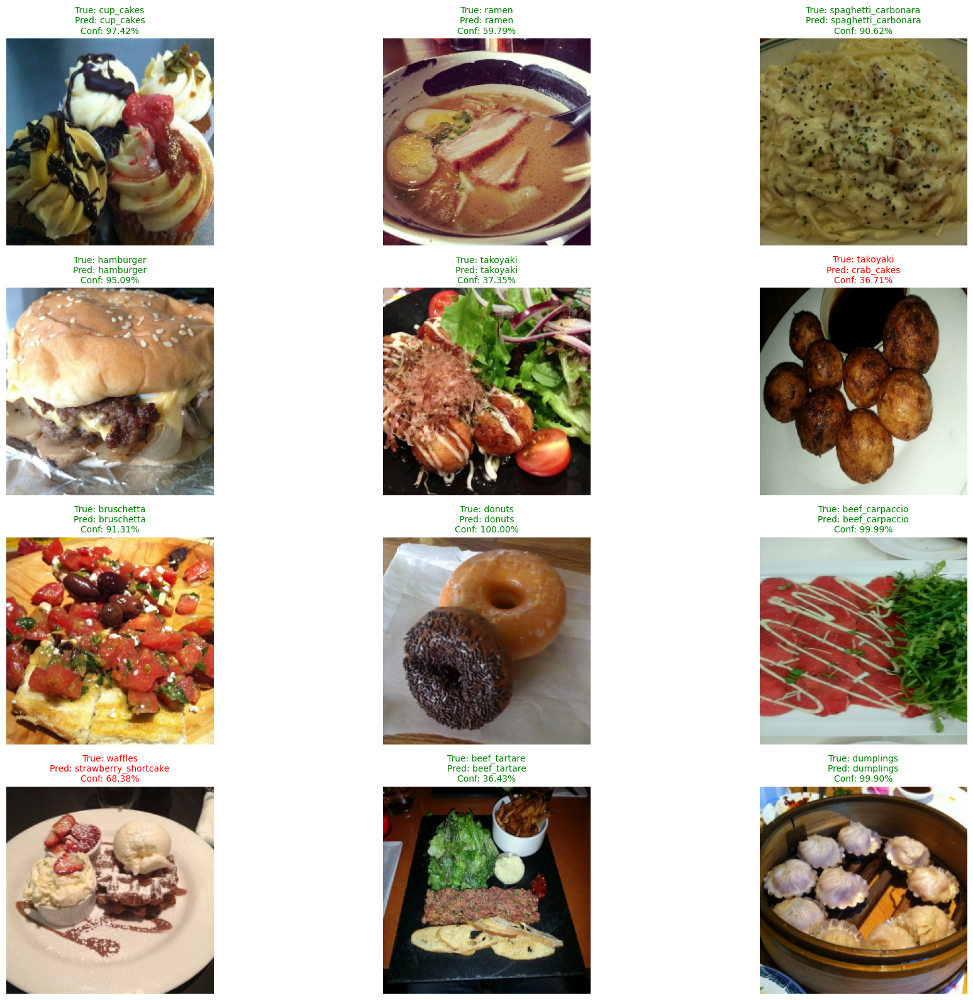

In [27]:
# Visualize predictions on test samples
def plot_predictions(model, dataset, class_names, num_images=12):
    """Plot predictions with confidence scores"""
    plt.figure(figsize=(20, 16))

    # We need to get the original images before preprocessing
    # Create a temporary dataset without EfficientNet preprocessing
    temp_dataset = (
        test_ds
        .map(lambda img, label: (tf.image.resize(img, [IMG_SIZE, IMG_SIZE]), label))
        .batch(BATCH_SIZE)
        .take(1)
    )

    # Get original images for display
    for orig_images, orig_labels in temp_dataset:
        # Create dummy masks for prediction
        masks = tf.ones((len(orig_images), IMG_SIZE, IMG_SIZE, 1), dtype=tf.float32)

        # Prepare images for prediction (apply EfficientNet preprocessing)
        from tensorflow.keras.applications.efficientnet import preprocess_input
        pred_images = preprocess_input(tf.cast(orig_images, tf.float32))

        # Get predictions
        predictions = model.predict([pred_images, masks], verbose=0)

        for i in range(min(num_images, len(orig_images))):
            ax = plt.subplot(4, 3, i + 1)

            # Display the original unprocessed image
            img = orig_images[i].numpy().astype(np.uint8)
            plt.imshow(img)

            predicted_class = np.argmax(predictions[i])
            confidence = predictions[i][predicted_class]
            true_class = orig_labels[i].numpy()

            # Color code: green if correct, red if incorrect
            color = 'green' if predicted_class == true_class else 'red'

            title = f"True: {class_names[true_class]}\n"
            title += f"Pred: {class_names[predicted_class]}\n"
            title += f"Conf: {confidence:.2%}"

            plt.title(title, color=color, fontsize=10)
            plt.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(MODELS_PATH, 'sample_predictions.png'), dpi=300, bbox_inches='tight')
    plt.show()

print("Sample Predictions on Test Set:")
plot_predictions(best_model, test_dataset, CLASS_NAMES, num_images=12)

## 14. Inference Function

In [34]:
def predict_food(model, image_path, mask=None, class_names=None, img_size=224):
    """
    Predict food class from an image file.

    Args:
        model: Trained CNN model
        image_path: Path to food image
        mask: Optional mask array (H, W, 1), defaults to all ones
        class_names: List of class names
        img_size: Target image size for model input (default: 224)

    Returns:
        dict: {
            'class_name': str,
            'confidence': float,
            'top_5_predictions': list of (class_name, confidence) tuples
        }
    """
    # Load and preprocess image
    from tensorflow.keras.applications.efficientnet import preprocess_input

    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [img_size, img_size])
    # Apply EfficientNet preprocessing (same as training)
    img = tf.cast(img, tf.float32)
    img = preprocess_input(img)
    img = tf.expand_dims(img, 0)  # Add batch dimension

    # Create or preprocess mask
    if mask is None:
        mask = tf.ones((1, img_size, img_size, 1), dtype=tf.float32)
    else:
        mask = tf.convert_to_tensor(mask, dtype=tf.float32)
        if len(mask.shape) == 2:
            mask = tf.expand_dims(mask, -1)
        mask = tf.image.resize(mask, [img_size, img_size])
        mask = tf.expand_dims(mask, 0)

    # Make prediction
    predictions = model.predict([img, mask], verbose=0)[0]

    # Get top prediction
    top_class_idx = np.argmax(predictions)
    top_confidence = predictions[top_class_idx]

    # Get top 5 predictions
    top_5_indices = np.argsort(predictions)[-5:][::-1]
    top_5_predictions = [
        (class_names[idx] if class_names else f"Class {idx}",
         float(predictions[idx]))
        for idx in top_5_indices
    ]

    result = {
        'class_name': class_names[top_class_idx] if class_names else f"Class {top_class_idx}",
        'confidence': float(top_confidence),
        'top_5_predictions': top_5_predictions
    }

    return result


def display_prediction(image_path, prediction_result):
    """
    Display image with prediction results.

    Args:
        image_path: Path to image file
        prediction_result: Dict from predict_food function
    """
    # Load and display image
    img = plt.imread(image_path)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    # Display image
    ax1.imshow(img)
    ax1.set_title(f"Predicted: {prediction_result['class_name']}\n"
                  f"Confidence: {prediction_result['confidence']:.2%}",
                  fontsize=14, fontweight='bold')
    ax1.axis('off')

    # Display top 5 predictions as bar chart
    top_5 = prediction_result['top_5_predictions']
    classes = [p[0] for p in top_5]
    confidences = [p[1] for p in top_5]

    colors = ['green' if i == 0 else 'skyblue' for i in range(len(classes))]

    ax2.barh(range(len(classes)), confidences, color=colors)
    ax2.set_yticks(range(len(classes)))
    ax2.set_yticklabels(classes)
    ax2.set_xlabel('Confidence', fontsize=12)
    ax2.set_title('Top 5 Predictions', fontsize=14, fontweight='bold')
    ax2.set_xlim([0, 1])

    # Add confidence values on bars
    for i, v in enumerate(confidences):
        ax2.text(v + 0.02, i, f'{v:.2%}', va='center', fontsize=10)

    plt.tight_layout()
    plt.show()


print("Inference functions defined:")
print("- predict_food(model, image_path, mask=None, class_names=None)")
print("- display_prediction(image_path, prediction_result)")

Inference functions defined:
- predict_food(model, image_path, mask=None, class_names=None)
- display_prediction(image_path, prediction_result)


## 15. Test Inference Function


Prediction Result:
{
  "class_name": "hamburger",
  "confidence": 0.9851330518722534,
  "top_5_predictions": [
    [
      "hamburger",
      0.9851330518722534
    ],
    [
      "pulled_pork_sandwich",
      0.011124144308269024
    ],
    [
      "falafel",
      0.0015953920083120465
    ],
    [
      "pancakes",
      0.00048554749810136855
    ],
    [
      "cup_cakes",
      0.00034861022140830755
    ]
  ]
}


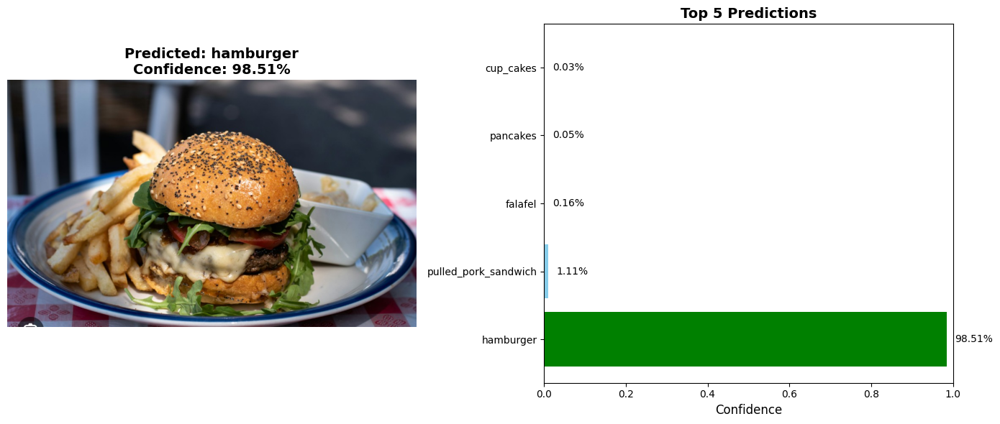

In [35]:
# Test the inference function on a sample from the test set
# save a test image first or use an external image

# create folder in colab and upload test image - in my case I did burger and fries

# Example usage :
test_image_path = "test_images/burger_n_fries.jpg"
result = predict_food(best_model, test_image_path, class_names=CLASS_NAMES)
print("\nPrediction Result:")
print(json.dumps(result, indent=2))
display_prediction(test_image_path, result)

## 16. Save Final Model

In [36]:
# Save the final trained model
final_model_path = os.path.join(MODELS_PATH, 'cnn_food_classifier_v01.keras')
best_model.save(final_model_path)

print(f"Final model saved to: {final_model_path}")
print(f"Model file size: {os.path.getsize(final_model_path) / (1024*1024):.2f} MB")

# Also save to local models directory if in Colab
local_model_path = os.path.join(BASE_PATH, 'models', 'cnn_food_classifier_v01.keras')
os.makedirs(os.path.dirname(local_model_path), exist_ok=True)
best_model.save(local_model_path)
print(f"Model also saved locally to: {local_model_path}")

Final model saved to: /content/drive/MyDrive/CSB410_Final/models/cnn_food_classifier_v01.keras
Model file size: 42.94 MB
Model also saved locally to: /content/drive/MyDrive/CSB410_Final/models/cnn_food_classifier_v01.keras


## 17. Export Model Metadata

In [37]:
# Save model metadata for easy loading and integration
metadata = {
    'model_name': 'CNN Food Classifier',
    'version': 'v01',
    'architecture': 'EfficientNetB0 + Dual-Input',
    'num_classes': NUM_CLASSES,
    'class_names': CLASS_NAMES,
    'input_shape': {
        'image': [IMG_SIZE, IMG_SIZE, 3],
        'mask': [IMG_SIZE, IMG_SIZE, 1]
    },
    'preprocessing': {
        'resize': [IMG_SIZE, IMG_SIZE],
        'normalization': 'divide_by_255',
        'range': [0.0, 1.0]
    },
    'training': {
        'dataset': 'Food101',
        'train_samples': int(tf.data.experimental.cardinality(train_ds).numpy()),
        'val_samples': int(tf.data.experimental.cardinality(val_ds).numpy()),
        'test_samples': int(tf.data.experimental.cardinality(test_ds).numpy()),
        'batch_size': BATCH_SIZE,
        'total_epochs': TOTAL_EPOCHS,
        'phase1_epochs': PHASE1_EPOCHS,
        'phase2_epochs': PHASE2_EPOCHS
    },
    'performance': {
        'test_accuracy': float(test_results[1]),
        'test_top5_accuracy': float(test_results[2]),
        'test_loss': float(test_results[0])
    },
    'created_at': datetime.now().strftime('%Y-%m-%d %H:%M:%S')
}

# Save metadata as JSON
metadata_path = os.path.join(MODELS_PATH, 'cnn_food_classifier_v01_metadata.json')
with open(metadata_path, 'w') as f:
    json.dump(metadata, f, indent=2)

print(f"Metadata saved to: {metadata_path}")
print("\nMetadata summary:")
print(json.dumps(metadata, indent=2))

Metadata saved to: /content/drive/MyDrive/CSB410_Final/models/cnn_food_classifier_v01_metadata.json

Metadata summary:
{
  "model_name": "CNN Food Classifier",
  "version": "v01",
  "architecture": "EfficientNetB0 + Dual-Input",
  "num_classes": 101,
  "class_names": [
    "apple_pie",
    "baby_back_ribs",
    "baklava",
    "beef_carpaccio",
    "beef_tartare",
    "beet_salad",
    "beignets",
    "bibimbap",
    "bread_pudding",
    "breakfast_burrito",
    "bruschetta",
    "caesar_salad",
    "cannoli",
    "caprese_salad",
    "carrot_cake",
    "ceviche",
    "cheesecake",
    "cheese_plate",
    "chicken_curry",
    "chicken_quesadilla",
    "chicken_wings",
    "chocolate_cake",
    "chocolate_mousse",
    "churros",
    "clam_chowder",
    "club_sandwich",
    "crab_cakes",
    "creme_brulee",
    "croque_madame",
    "cup_cakes",
    "deviled_eggs",
    "donuts",
    "dumplings",
    "edamame",
    "eggs_benedict",
    "escargots",
    "falafel",
    "filet_mignon",
    "fi

## 18. Model Architecture Summary Export

In [38]:
# Export model summary to text file for documentation
summary_path = os.path.join(MODELS_PATH, 'cnn_food_classifier_v01_summary.txt')

with open(summary_path, 'w') as f:
    # Redirect model.summary() to file
    best_model.summary(print_fn=lambda x: f.write(x + '\n'))

    # Add additional information
    f.write('\n' + '='*80 + '\n')
    f.write('MODEL DETAILS\n')
    f.write('='*80 + '\n\n')

    f.write(f"Total Parameters: {best_model.count_params():,}\n")
    f.write(f"Model Size: {os.path.getsize(final_model_path) / (1024*1024):.2f} MB\n\n")

    f.write("Input Specifications:\n")
    f.write(f"  - Image Input: (batch, {IMG_SIZE}, {IMG_SIZE}, 3)\n")
    f.write(f"  - Mask Input: (batch, {IMG_SIZE}, {IMG_SIZE}, 1)\n\n")

    f.write("Output Specifications:\n")
    f.write(f"  - Output Shape: (batch, {NUM_CLASSES})\n")
    f.write(f"  - Activation: Softmax\n")
    f.write(f"  - Classes: {NUM_CLASSES} food categories\n\n")

    f.write("Performance Metrics:\n")
    f.write(f"  - Test Accuracy: {test_results[1]:.4f} ({test_results[1]*100:.2f}%)\n")
    f.write(f"  - Test Top-5 Accuracy: {test_results[2]:.4f} ({test_results[2]*100:.2f}%)\n")
    f.write(f"  - Test Loss: {test_results[0]:.4f}\n")

print(f"Model architecture summary exported to: {summary_path}")

Model architecture summary exported to: /content/drive/MyDrive/CSB410_Final/models/cnn_food_classifier_v01_summary.txt
